# core

> Fill in a module description here

In [ ]:
#| default_exp core

In [ ]:
#| hide
from nbdev.showdoc import *
from IPython.display import HTML, clear_output
%reload_ext autoreload
%autoreload 2

In [ ]:
#| export 
import torch
from torch import autocast
from torchvision import transforms as tfms

from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging

from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler
from diffusers import DiffusionPipeline

from tqdm.auto import tqdm
import PIL
from matplotlib import pyplot as plt
import numpy as np
from base64 import b64encode

logging.set_verbosity_error()

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    # https://huggingface.co/docs/diffusers/optimization/mps
    device = "mps"
else:
    device = "cpu"
    
HF_SD_MODEL = "runwayml/stable-diffusion-v1-5"
HF_CLIP_MODEL = "openai/clip-vit-large-patch14"
# HF_CUSTOM_PIPELINE = "stable_diffusion_mega"

NOTE: Redirects are currently not supported in Windows or MacOs.


# initialize components

## initialize all components in fp16

In [ ]:
#| export
scheduler = LMSDiscreteScheduler(
    beta_start=0.00085, 
    beta_end=0.012, 
    beta_schedule="scaled_linear", 
    num_train_timesteps=1000
)

In [ ]:
#| export
if device == "mps":
    pipe = DiffusionPipeline.from_pretrained(
        HF_SD_MODEL, 
        scheduler=scheduler
    )
else:
    pipe = DiffusionPipeline.from_pretrained(
        HF_SD_MODEL, 
    #     custom_pipeline=HF_CUSTOM_PIPELINE, 
        torch_dtype=torch.float16, 
        revision="fp16",
        scheduler=scheduler
    )
    
pipe.to(device)
pipe.enable_attention_slicing()
# clear_output()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

In [ ]:
#| export
vae = pipe.vae
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
unet = pipe.unet
scheduler = pipe.scheduler

if device == "mps":
    generator_device = "cpu"
else:
    generator_device = device
    
generator = torch.Generator(device=generator_device)
initial_seed = generator.initial_seed()

In [ ]:
prompt = "a photo of an astronaut riding a horse on mars"

# First-time "warmup" pass (see explanation above)
_ = pipe(prompt, num_inference_steps=1)

SDFDFFDS


  0%|          | 0/1 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [ ]:
# Results match those from the CPU device after the warmup pass.
pipe_out = pipe(prompt, num_inference_steps=5)
pipe_out

  0%|          | 0/5 [00:00<?, ?it/s]

StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512>], nsfw_content_detected=[False])

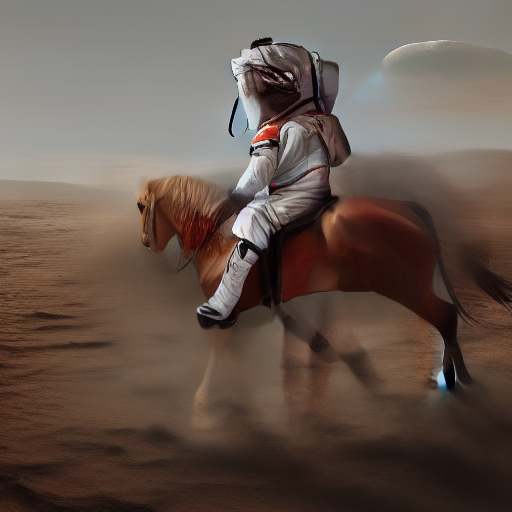

In [ ]:
image = pipe_out.images[0]
image

# Playground

In [ ]:
#| server
prompt = "anime girl P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed"
# prompt = "A watercolor painting of an otter"
steps = 50
cfg = 7.5
seed = 204103447
# seed = 32
generator.manual_seed(seed)
# generator = generator.to(device)
batch_size = 1
height = 512
width = 512

In [ ]:
text_input = tokenizer(
    prompt, 
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

In [ ]:
tokenizer.model_max_length

77

In [ ]:
text_input

{'input_ids': tensor([[49406,  6469,  1611,   335,   269,   320,   269,  2322, 27846, 12609,
           537, 29616,  7997, 19892,  3320, 11124, 46865, 22146, 16157,  1994,
         12609, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
input_ids = text_input['input_ids'][0]
for token_id in input_ids:
    token = tokenizer.decode(token_id)
    print(token_id, token)
    
    if token_id == tokenizer.eos_token_id:
        
        break

tensor(49406) <|startoftext|>
tensor(6469) anime
tensor(1611) girl
tensor(335) p
tensor(269) .
tensor(320) a
tensor(269) .
tensor(2322) works
tensor(27846) insanely
tensor(12609) detailed
tensor(537) and
tensor(29616) intricate
tensor(7997) hyper
tensor(19892) maxim
tensor(3320) alist
tensor(11124) elegant
tensor(46865) ornate
tensor(22146) hyper
tensor(16157) realistic
tensor(1994) super
tensor(12609) detailed
tensor(49407) <|endoftext|>


In [ ]:
with torch.no_grad():
    text_out = text_encoder(text_input.input_ids.to(device))

In [ ]:
type(text_out), len(text_out)

(transformers.modeling_outputs.BaseModelOutputWithPooling, 2)

In [ ]:
text_emb = text_out[0]
text_emb.shape

torch.Size([1, 77, 768])

In [ ]:
text_out[1].shape

torch.Size([1, 768])

In [ ]:
max_length = text_input.input_ids.shape[-1]
max_length

77

In [ ]:
vocab = tokenizer.get_vocab()
len(vocab)

49408

In [ ]:
tokenizer("")

{'input_ids': [49406, 49407], 'attention_mask': [1, 1]}

In [ ]:
tokenizer.decode([49406, 49407])

'<|startoftext|><|endoftext|>'

In [ ]:
uncond_input = tokenizer(
    [""] * batch_size,
    padding="max_length",
    max_length=max_length,
    return_tensors="pt"
)
uncond_input

{'input_ids': tensor([[49406, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
with torch.no_grad():
    uncond_emb = text_encoder(uncond_input.input_ids.to(device))[0] 

uncond_emb.shape

torch.Size([1, 77, 768])

In [ ]:
text_emb.shape

torch.Size([1, 77, 768])

In [ ]:
concat_emb = torch.cat([uncond_emb, text_emb])
concat_emb.shape

torch.Size([2, 77, 768])

In [ ]:
steps

50

In [ ]:
orig_timesteps = scheduler.timesteps
orig_timesteps.shape

torch.Size([50])

In [ ]:
scheduler.set_timesteps(steps)
scheduler.timesteps

tensor([999.0000, 978.6122, 958.2245, 937.8367, 917.4490, 897.0612, 876.6735,
        856.2857, 835.8980, 815.5102, 795.1224, 774.7347, 754.3469, 733.9592,
        713.5714, 693.1837, 672.7959, 652.4082, 632.0204, 611.6327, 591.2449,
        570.8571, 550.4694, 530.0816, 509.6939, 489.3061, 468.9184, 448.5306,
        428.1429, 407.7551, 387.3673, 366.9796, 346.5918, 326.2041, 305.8163,
        285.4286, 265.0408, 244.6531, 224.2653, 203.8776, 183.4898, 163.1020,
        142.7143, 122.3265, 101.9388,  81.5510,  61.1633,  40.7755,  20.3878,
          0.0000], dtype=torch.float64)

In [ ]:
unet.in_channels, unet.out_channels

(4, 4)

In [ ]:
# generator.seed()

4357939394765375

In [ ]:
generator = torch.Generator(device=device)
generator.manual_seed(204103447)

<torch._C.Generator>

In [ ]:
generator.seed()

4371373956152805

In [ ]:
generator.seed()

8416793279967711

In [ ]:
# good
# 6820215742699044

In [ ]:
# generator = torch.Generator(device=device)
generator.manual_seed(6820215742699044)

<torch._C.Generator>

In [ ]:
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8), 
    generator=generator,
    device=device
)

init_latents = torch.clone(latents)

In [ ]:
latents.shape

torch.Size([1, 4, 64, 64])

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

In [ ]:
latents[0, :1, :4, :4]

tensor([[[-0.2401,  1.1433, -0.4498, -0.9844],
         [ 0.2108,  0.8164,  0.5860, -0.3733],
         [-0.9705, -0.0507, -1.0795, -1.4027],
         [-0.6217,  0.2110, -0.2411,  0.2505]]], device='cuda:0')

In [ ]:
latents = latents * scheduler.init_noise_sigma
latents[0, :1, :4, :4]

tensor([[[ -3.5088,  16.7095,  -6.5731, -14.3861],
         [  3.0804,  11.9309,   8.5641,  -5.4561],
         [-14.1829,  -0.7409, -15.7764, -20.4997],
         [ -9.0863,   3.0833,  -3.5241,   3.6608]]], device='cuda:0')

In [ ]:
latents.shape

torch.Size([1, 4, 64, 64])

In [ ]:
with autocast(device):
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        
        latent_model_input = torch.cat([latents] * 2)
#         print(latent_model_input.shape)

        sigma = scheduler.sigmas[i]
#         print(f'index {i}, timestep: {t}, sigma: {sigma}')
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)
        
        with torch.no_grad():
            unet_out = unet(latent_model_input, t, encoder_hidden_states=concat_emb)
            noise_pred = unet_out.sample
#             print(noise_pred.shape)
            
        noise_pred_uncond, noise_pred_txt = noise_pred.chunk(2)
#         print('perform guidance')
        noise_pred = noise_pred_uncond + cfg * (noise_pred_txt - noise_pred_uncond)
        
        
        latents = scheduler.step(noise_pred, t, latents).prev_sample
        
    

0it [00:00, ?it/s]

In [ ]:
latents[0, :1, :4, :4]

tensor([[[ 0.3297,  0.4397,  0.1659, -0.6605],
         [-0.0663,  0.7130,  0.5704,  0.3943],
         [-0.2344,  0.4534, -0.1721, -0.9068],
         [-0.5482,  0.4771, -0.1239,  0.4579]]], device='cuda:0')

In [ ]:
latents = 1 / 0.18215 * latents

In [ ]:
latents[0, :1, :4, :4]

tensor([[[ 1.8100,  2.4141,  0.9107, -3.6261],
         [-0.3642,  3.9145,  3.1315,  2.1645],
         [-1.2866,  2.4892, -0.9449, -4.9781],
         [-3.0094,  2.6190, -0.6802,  2.5136]]], device='cuda:0')

In [ ]:
with autocast(device):
    with torch.no_grad():
        vae_out = vae.decode(latents)

In [ ]:
img = vae_out.sample
img.shape

torch.Size([1, 3, 512, 512])

In [ ]:
img.min(), img.max()

(tensor(-1.3184, device='cuda:0', dtype=torch.float16),
 tensor(1.1289, device='cuda:0', dtype=torch.float16))

In [ ]:
img = (img / 2 + 0.5).clamp(0, 1)
img = img.detach().cpu().permute(0, 2, 3, 1).numpy()
img = (img * 255).round().astype("uint8")
img.shape

(1, 512, 512, 3)

In [ ]:
pil_imgs = [PIL.Image.fromarray(im) for im in img]

In [ ]:
len(pil_imgs)

1

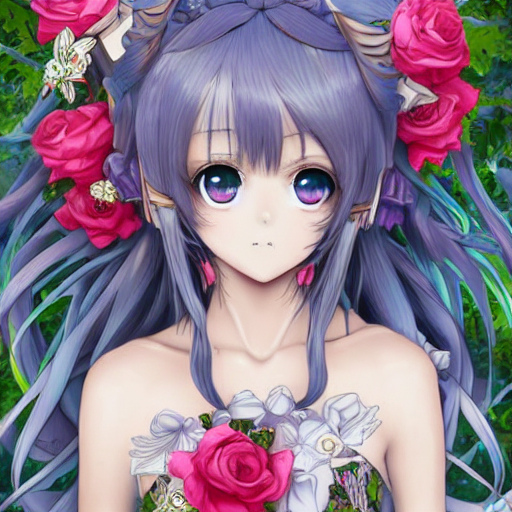

In [ ]:
pil_imgs[0]

In [ ]:
pipe = StableDiffusionPipeline(
    vae=vae,
    text_encoder=text_encoder,
    tokenizer=tokenizer,
    unet=unet,
    scheduler=scheduler,
    safety_checker=None,
    feature_extractor=None
)
# pipe = pipe.to(device)

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
pipe.device

device(type='cuda', index=0)

In [ ]:
seed

204103447

In [ ]:
pipe_out = pipe(prompt, num_inference_steps=steps, generator=generator, latents=init_latents)

  0%|          | 0/50 [00:00<?, ?it/s]

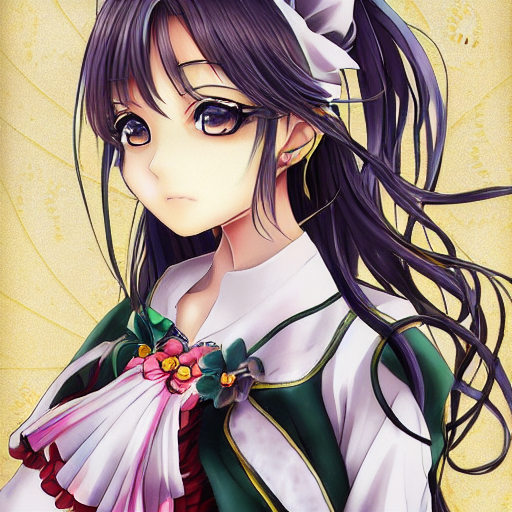

In [ ]:
pipe_out.images[0]

In [ ]:
im = pipe_out.images[0]
im.save("test.png")

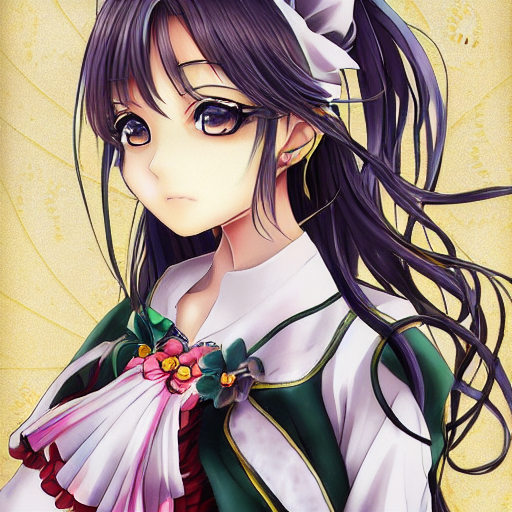

In [ ]:
pil_img = PIL.Image.open("test.png")
pil_img

In [ ]:
im = tfms.ToTensor()(pil_img)
im.shape

torch.Size([3, 512, 512])

In [ ]:
batch_im = im.unsqueeze(0).to(device) *2 - 1
batch_im.shape

torch.Size([1, 3, 512, 512])

In [ ]:
with torch.no_grad():
    vae_out = vae.encode(batch_im)
vae_out

AutoencoderKLOutput(latent_dist=<diffusers.models.vae.DiagonalGaussianDistribution object>)

In [ ]:
latent_dist = vae_out.latent_dist

In [ ]:
encoded = latent_dist.sample() * 0.18215
encoded.shape

torch.Size([1, 4, 64, 64])

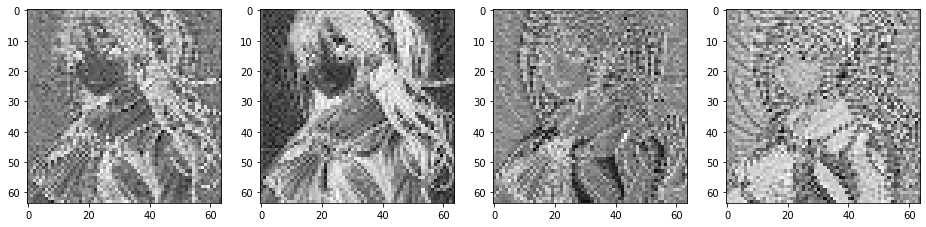

In [ ]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(encoded[0][c].cpu(), cmap='Greys')

In [ ]:
scaled_encoded = (1 / 0.18215) * encoded
with torch.no_grad():
    decoded = vae.decode(scaled_encoded).sample

decoded.shape

torch.Size([1, 3, 512, 512])

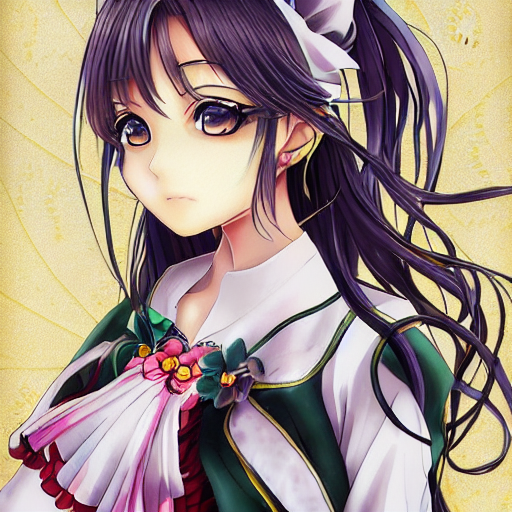

In [ ]:
decoded = (decoded / 2 + 0.5).clamp(0, 1)
decoded = decoded.detach().cpu().permute(0, 2, 3, 1).numpy()
decoded = (decoded * 255).round().astype("uint8")
pil_im = [PIL.Image.fromarray(i) for i in decoded]
pil_im[0]

In [ ]:
encoded.shape

torch.Size([1, 4, 64, 64])

In [ ]:
noise = torch.randn_like(encoded)

In [ ]:
scheduler.set_timesteps(15)

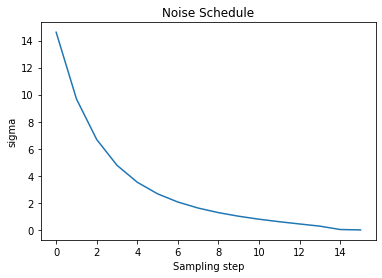

In [ ]:
plt.plot(scheduler.sigmas)
plt.title('Noise Schedule')
plt.xlabel('Sampling step')
plt.ylabel('sigma')
plt.show()

In [ ]:
sampling_step = 10
scheduler.timesteps[sampling_step]

tensor(285.4286, device='cuda:0', dtype=torch.float64)

In [ ]:
scheduler.sigmas[sampling_step]

tensor(0.7913, device='cuda:0')

In [ ]:
encoded_and_noised = scheduler.add_noise(
    encoded, 
    noise, 
    timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))

encoded_and_noised.shape

torch.Size([1, 4, 64, 64])

In [ ]:
def latent_to_pil(l):
    l = (1 / 0.18215) * l
    with torch.no_grad():
        decoded = vae.decode(l).sample
#     print(decoded.shape)
    
    img = (decoded / 2 + 0.5).clamp(0, 1)
    img = img.detach().cpu().permute(0, 2, 3, 1).numpy()
    img = (img * 255).round().astype("uint8")
    pil_imgs = [PIL.Image.fromarray(i) for i in img]
    return pil_imgs[0]
    

torch.Size([1, 3, 512, 512])


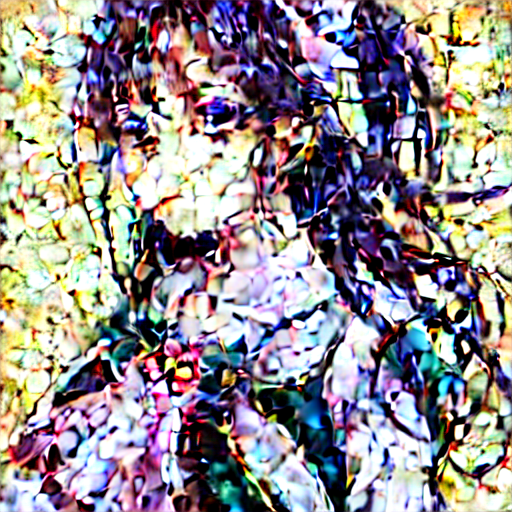

In [ ]:
latent_to_pil(encoded_and_noised)

In [ ]:
scheduler.add_noise??

Signature:
scheduler.add_noise(
    original_samples: torch.FloatTensor,
    noise: torch.FloatTensor,
    timesteps: torch.FloatTensor,
) -> torch.FloatTensor
Docstring: <no docstring>
Source:   
    def add_noise(
        self,
        original_samples: torch.FloatTensor,
        noise: torch.FloatTensor,
        timesteps: torch.FloatTensor,
    ) -> torch.FloatTensor:
        # Make sure sigmas and timesteps have the same device and dtype as original_samples
        self.sigmas = self.sigmas.to(device=original_samples.device, dtype=original_samples.dtype)
        if original_samples.device.type == "mps" and torch.is_floating_point(timesteps):
            # mps does not support float64
            self.timesteps = self.timesteps.to(original_samples.device, dtype=torch.float32)
            timesteps = timesteps.to(original_samples.device, dtype=torch.float32)
        else:
            self.timesteps = self.timesteps.to(original_samples.device)
            timesteps = timesteps.to(ori

In [ ]:
manual_encoded_and_noised = encoded \
    + torch.rand_like(encoded) * scheduler.sigmas[sampling_step]

torch.Size([1, 3, 512, 512])


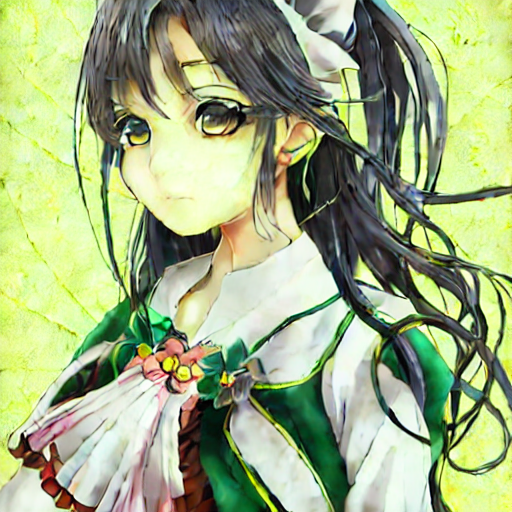

In [ ]:
latent_to_pil(manual_encoded_and_noised)

In [ ]:
new_prompt = prompt.replace('girl', 'boy')
new_prompt

'anime boy P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

torch.Size([1, 3, 512, 512])


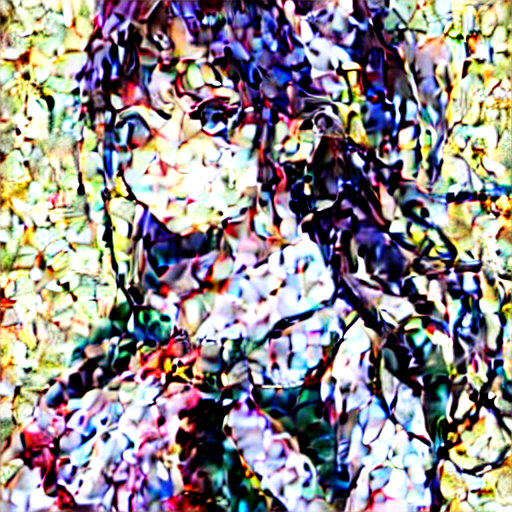

In [ ]:
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50           # Number of denoising steps
guidance_scale = 8                  # Scale for classifier-free guidance
batch_size = 1

torch.manual_seed(seed)

# Prep text (same as before)
text_input = tokenizer(new_prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler (setting the number of inference steps)
scheduler.set_timesteps(num_inference_steps)

# Prep latents (noising appropriately for start_step)
start_step = 35
start_sigma = scheduler.sigmas[start_step]
noise = torch.randn_like(encoded)
latents = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
latents = latents.to(torch_device).float()
latent_to_pil(latents)

In [ ]:
# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    
    if i > start_step: # << This is the only modification to the loop we do
        
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample
    else:
        pass

0it [00:00, ?it/s]

torch.Size([1, 3, 512, 512])


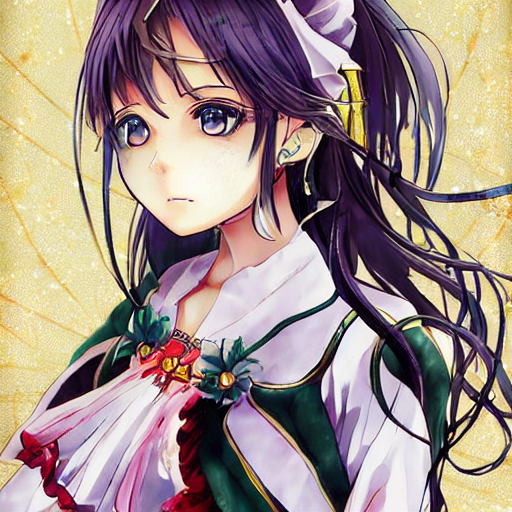

In [ ]:
latent_to_pil(latents)

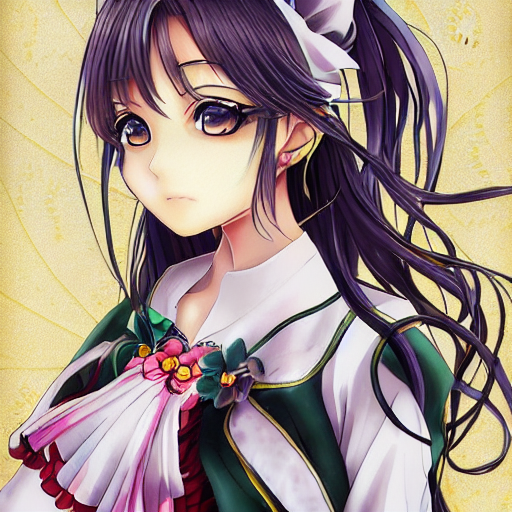

In [ ]:
pil_im[0]

In [ ]:
p = new_prompt
p

'anime boy P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

In [ ]:
txt_input = tokenizer(p, 
                      padding="max_length", 
                      max_length=tokenizer.model_max_length, 
                      truncation=True, 
                      return_tensors="pt")


input_ids = txt_input['input_ids'][0]
input_ids

tensor([49406,  6469,  1876,   335,   269,   320,   269,  2322, 27846, 12609,
          537, 29616,  7997, 19892,  3320, 11124, 46865, 22146, 16157,  1994,
        12609, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
        49407, 49407, 49407, 49407, 49407, 49407, 49407])

In [ ]:
for token_id in input_ids:
    if token_id == tokenizer.eos_token_id: break
    print(token_id, tokenizer.decode(token_id))


tensor(49406) <|startoftext|>
tensor(6469) anime
tensor(1876) boy
tensor(335) p
tensor(269) .
tensor(320) a
tensor(269) .
tensor(2322) works
tensor(27846) insanely
tensor(12609) detailed
tensor(537) and
tensor(29616) intricate
tensor(7997) hyper
tensor(19892) maxim
tensor(3320) alist
tensor(11124) elegant
tensor(46865) ornate
tensor(22146) hyper
tensor(16157) realistic
tensor(1994) super
tensor(12609) detailed


In [ ]:
text_encoder.text_model.embeddings

CLIPTextEmbeddings(
  (token_embedding): Embedding(49408, 768)
  (position_embedding): Embedding(77, 768)
)

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

## The UNET and CFG

In [ ]:
scheduler.set_timesteps(50)

t = scheduler.timesteps[0]
sigma = scheduler.sigmas[0]
scheduler.timesteps

tensor([999.0000, 978.6122, 958.2245, 937.8367, 917.4490, 897.0612, 876.6735,
        856.2857, 835.8980, 815.5102, 795.1224, 774.7347, 754.3469, 733.9592,
        713.5714, 693.1837, 672.7959, 652.4082, 632.0204, 611.6327, 591.2449,
        570.8571, 550.4694, 530.0816, 509.6939, 489.3061, 468.9184, 448.5306,
        428.1429, 407.7551, 387.3673, 366.9796, 346.5918, 326.2041, 305.8163,
        285.4286, 265.0408, 244.6531, 224.2653, 203.8776, 183.4898, 163.1020,
        142.7143, 122.3265, 101.9388,  81.5510,  61.1633,  40.7755,  20.3878,
          0.0000], dtype=torch.float64)

In [ ]:
t, sigma

(tensor(999., dtype=torch.float64), tensor(14.6146))

In [ ]:
torch.manual_seed(seed)
latent = torch.randn((1, unet.in_channels, height // 8, width // 8))

In [ ]:
latent.device

device(type='cpu')

In [ ]:
scheduler.init_noise_sigma

tensor(14.6146)

In [ ]:
latent = latent.to(device)
latent = latent * scheduler.init_noise_sigma

In [ ]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, 
                       truncation=True, return_tensors="pt"
                      )

In [ ]:
text_input

{'input_ids': tensor([[49406,  6469,  1611,   335,   269,   320,   269,  2322, 27846, 12609,
           537, 29616,  7997, 19892,  3320, 11124, 46865, 22146, 16157,  1994,
         12609, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

In [ ]:
with torch.no_grad():
    text_emb = text_encoder(text_input.input_ids.to(device))[0]

In [ ]:
with torch.no_grad():
    noise_pred = unet(latent, t, encoder_hidden_states=text_emb)['sample']

In [ ]:
noise_pred.shape

torch.Size([1, 4, 64, 64])

torch.Size([1, 3, 512, 512])


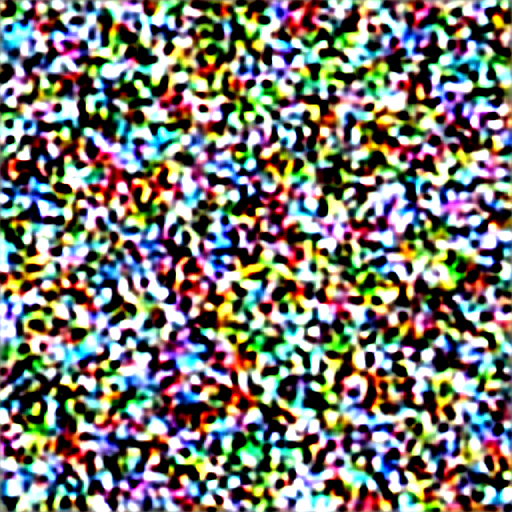

In [ ]:
latent_to_pil(latent - noise_pred)

In [ ]:
prompt

'anime girl P.A.Works insanely detailed and intricate hypermaximalist elegant ornate hyper realistic super detailed'

In [ ]:
from PIL import Image

In [ ]:
guidance_scale = 7.5

In [ ]:
seed

204103447

In [ ]:
!rm -rf steps/
!mkdir -p steps/

# Prep text 
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# torch.manual_seed(seed)
generator.manual_seed(seed)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
#   generator=generator,
    device=device
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    # Get the predicted x0:
    # latents_x0 = latents - sigma * noise_pred # Calculating ourselves
    latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample # Using the scheduler (Diffusers 0.4 and above)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample

    # To PIL Images
    im_t0 = latent_to_pil(latents_x0)
    im_next = latent_to_pil(latents)

    # Combine the two images and save for later viewing
    im = PIL.Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))
    im.paste(im_t0, (512, 0))
    im.save(f'steps/{i:04}.jpeg')

0it [00:00, ?it/s]

In [ ]:
# Make and show the progress video (change width to 1024 for full res)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
# scheduler.step??

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()